# 04 - Predictions

Realizar predicciones con el modelo entrenado sobre imágenes nuevas.

## 1. Importar librerías

In [1]:
import sys
import os
# sys.path.append(os.path.join(os.getcwd(), '../../src'))
PROJECT_ROOT = os.path.abspath(os.path.join(os.getcwd(), '..', '..'))
sys.path.append(PROJECT_ROOT)

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from src.utils import (
    load_data_npz,
    predict_and_visualize,
    batch_predict,
    visualize_predictions,
    predict_array,
    get_predictions_summary,
    prediccion,
    predicciones,
    DATA_NPZ_PATH,
    MODEL_PATH,
    PRODUCTION_MODEL_PATH
)

## 2. Cargar modelo

In [2]:
# Cargar el modelo de producción
model_name = 'Xception'
model_path = MODEL_PATH + model_name + '.keras'
# model_path = os.path.join(PRODUCTION_MODEL_PATH, model_name, '.keras')

if os.path.exists(model_path):
    model = tf.keras.models.load_model(model_path)
    print(f'Modelo cargado desde: {model_path}')
else:
    print(f'Modelo no encontrado en {model_path}')
    # Intenta cargar otro modelo disponible
    model_dir = '../../src/model'
    if os.path.exists(model_dir):
        models = [f for f in os.listdir(model_dir) if f.endswith('.keras')]
        if models:
            model_path = os.path.join(model_dir, models[0])
            model = tf.keras.models.load_model(model_path)
            print(f'Modelo cargado: {model_path}')



Modelo cargado desde: c:\Users\urkow\Documents\Documentos_Clase\Ants_trajectories_ML\src/model/Xception.keras


## 3. Cargar datos de test

In [3]:
# DATA_NPZ_PATH, DATA_AUG_NPZ_PATH
X_train, X_test, y_train, y_test = load_data_npz(DATA_NPZ_PATH)

# Redimensionar para Xception si es necesario
X_test_xception = tf.image.resize(X_test, [299, 299]).numpy()

print(f'Datos cargados: {X_test_xception.shape}')

Datos cargados: (177, 299, 299, 3)


## 4. Predicciones en lote

In [5]:
# Obtener resumen de predicciones
summary = get_predictions_summary(model, X_test_xception, y_test)

print(f'\nResumen de predicciones:')
print(f'  Accuracy general:  {summary["total_accuracy"]:.4f}')
print(f'  Accuracy "cara":   {summary["cara_accuracy"]:.4f}')
print(f'  Accuracy "sin_cara": {summary["sin_cara_accuracy"]:.4f}')
print(f'\nMuestras:')
print(f'  Total: {summary["total_samples"]}')
print(f'  Cara: {summary["cara_samples"]}')
print(f'  Sin cara: {summary["sin_cara_samples"]}')


Resumen de predicciones:
  Accuracy general:  0.8249
  Accuracy "cara":   0.7529
  Accuracy "sin_cara": 0.8913

Muestras:
  Total: 177
  Cara: 85
  Sin cara: 92


## 5. Visualizar predicciones

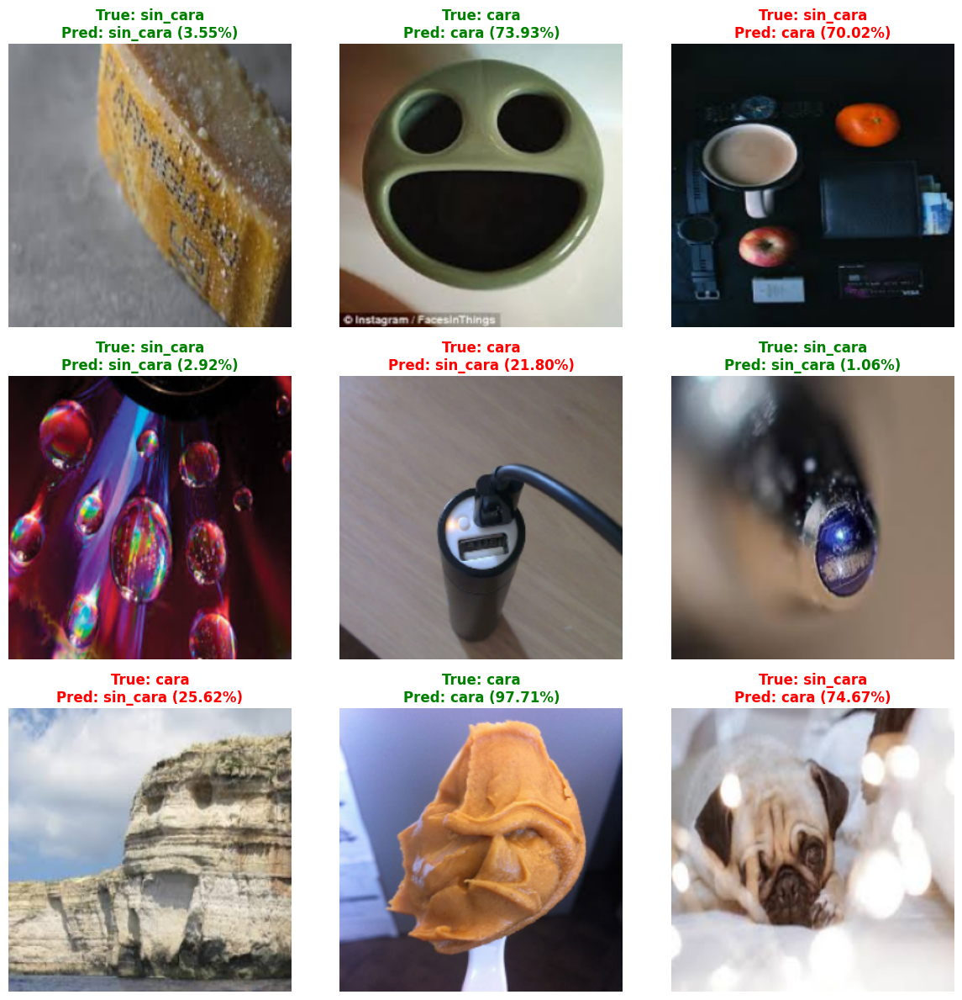

In [6]:
# Visualizar grilla de predicciones
visualize_predictions(model, X_test_xception, y_test, num_samples=9, figsize=(12, 12))

## 6. Predicción en imagen individual

In [ ]:
# Ejemplo: Predicción en imagen individual
# Descomentar y ajustar la ruta según sea necesario

# image_path = '../../data/test/cara/sample.jpg'
# result = predict_and_visualize(model, image_path, size=(299, 299))

Imports

In [1]:
import os, sys
import tensorflow as tf
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..', '..')))
from src.utils import MODEL_PATH, predicciones

Cargamos modelo

In [4]:
# Cargar el modelo de producción
# Modelos: 'Xception'/'Xception_finetuned'/'Xception_augmented'/'Xception_augmented_finetuned'
model_name = 'Xception_augmented_finetuned' 
model_path = MODEL_PATH + model_name + '.keras'
# model_path = os.path.join(PRODUCTION_MODEL_PATH, model_name, '.keras')

if os.path.exists(model_path):
    model = tf.keras.models.load_model(model_path)
    print(f'Modelo cargado desde: {model_path}')
else:
    print(f'Modelo no encontrado en {model_path}')
    # Intenta cargar otro modelo disponible
    model_dir = '../../src/model'
    if os.path.exists(model_dir):
        models = [f for f in os.listdir(model_dir) if f.endswith('.keras')]
        if models:
            model_path = os.path.join(model_dir, models[0])
            model = tf.keras.models.load_model(model_path)
            print(f'Modelo cargado: {model_path}')

Modelo cargado desde: c:\Users\urkow\Documents\Documentos_Clase\Ants_trajectories_ML\src/model/Xception_augmented_finetuned.keras


Predecimos

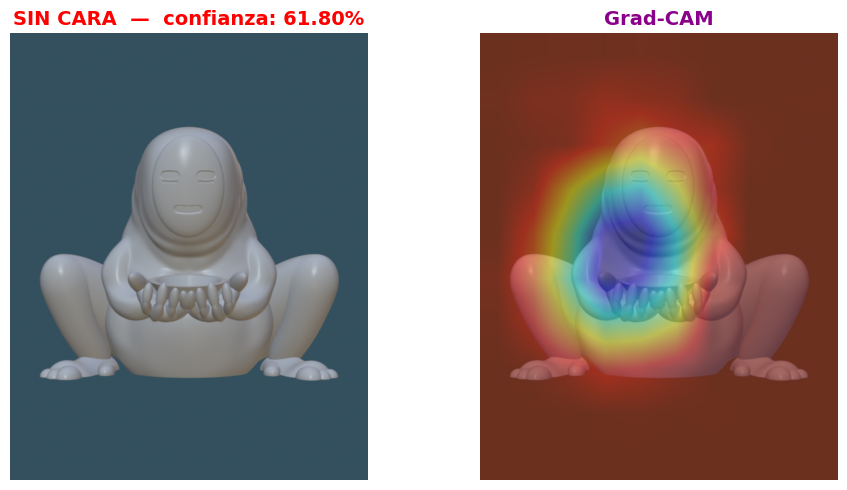

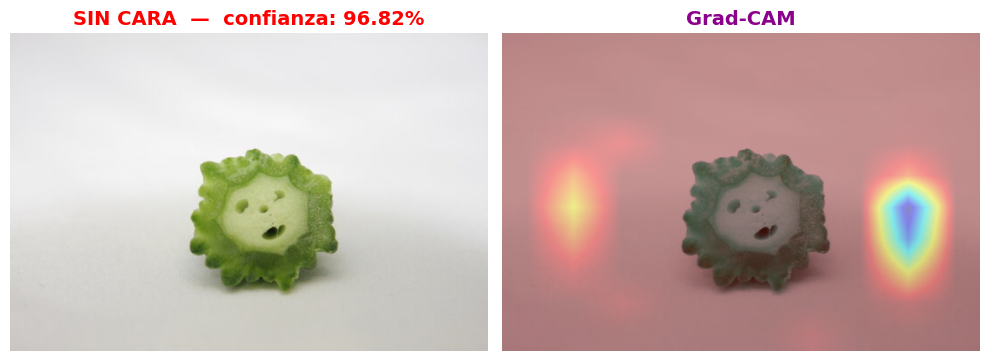

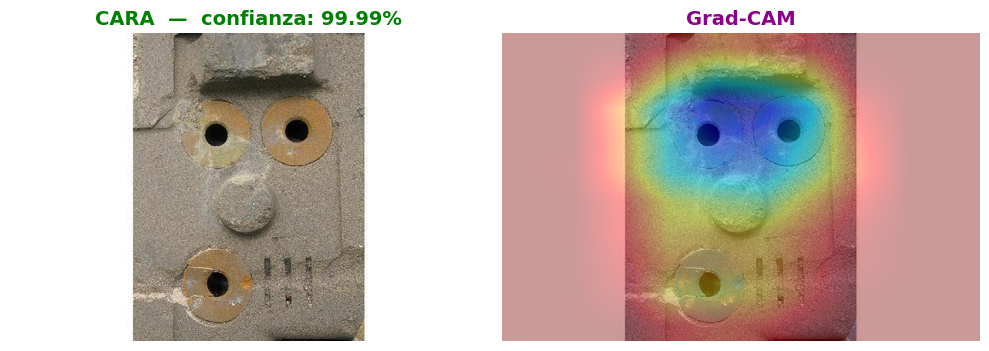

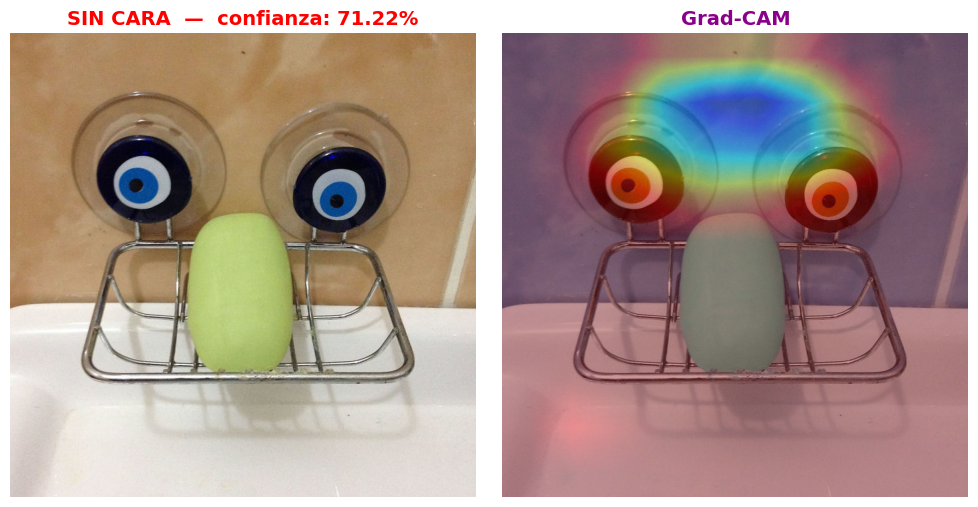

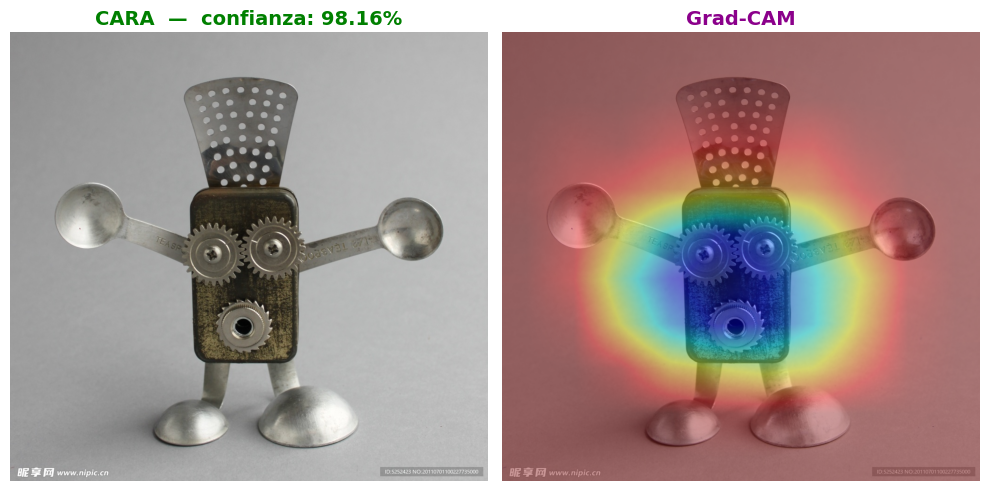

...

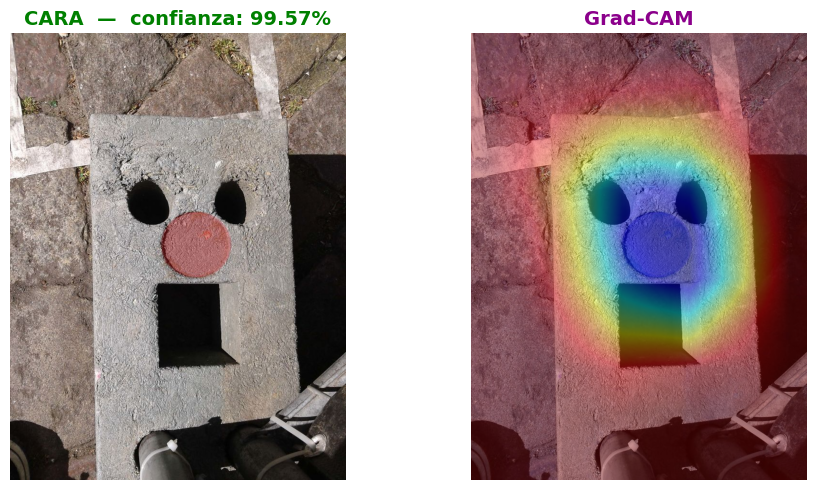

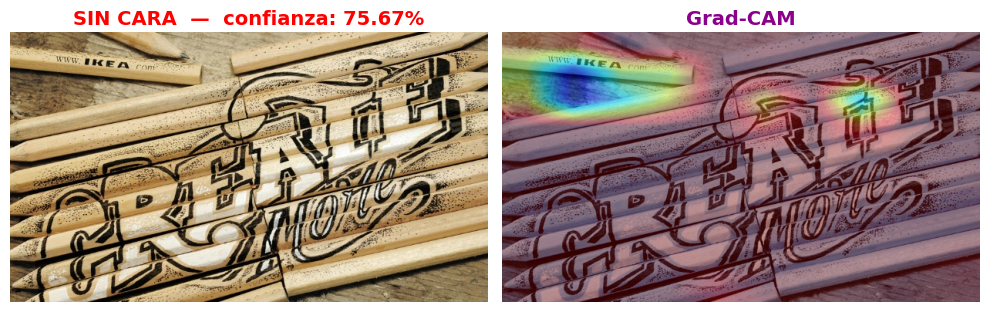

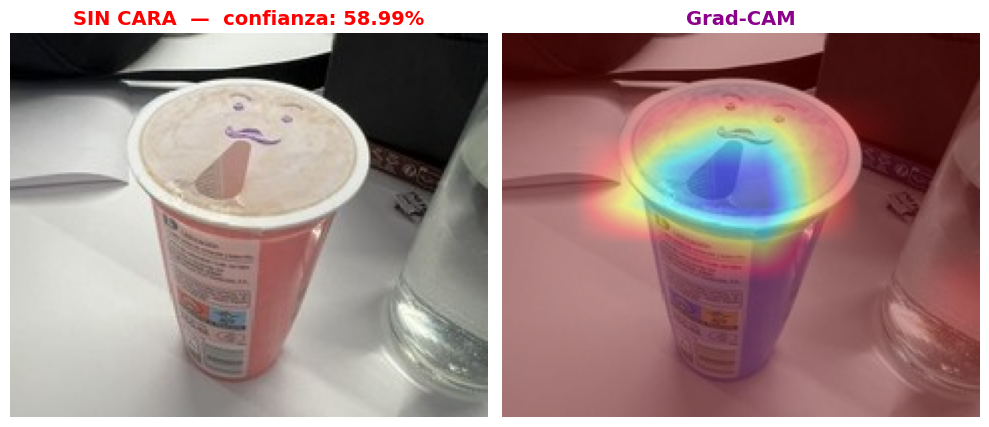

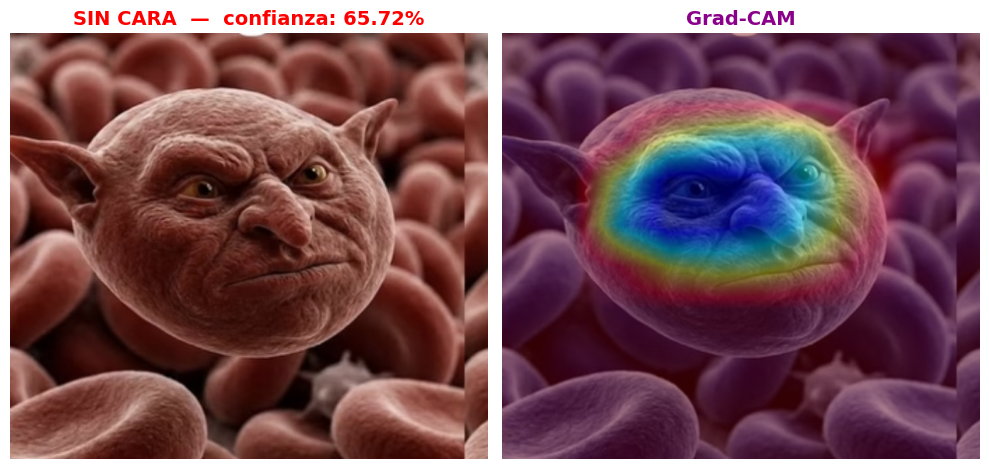

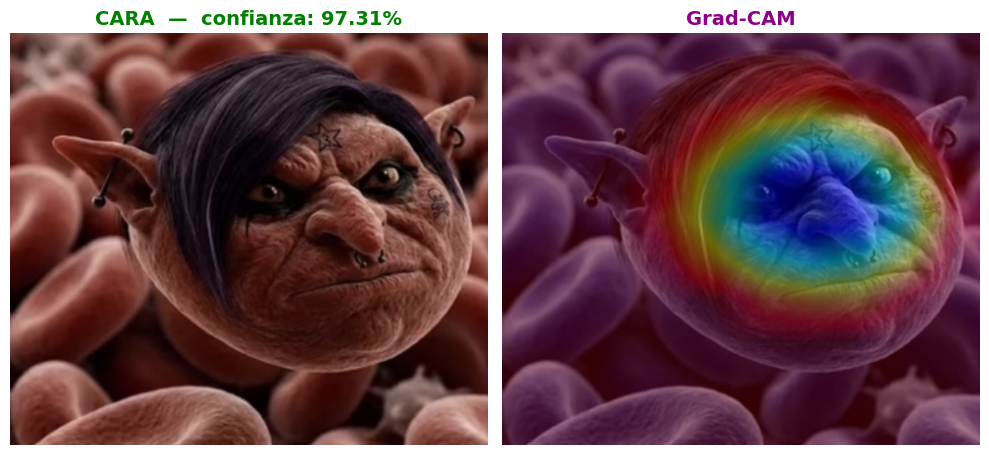

In [5]:
predicciones(model)